# (sliced) Wasserstein gradient flows
### (based on POT)

In [1]:
# Authors: Laetitia Chapel & Felipe Tobar, 2024
# Based on the POT documentation

import numpy as np
import matplotlib.pylab as pl
import ot
from ot.datasets import make_1D_gauss as gauss

import plotly.io as pio
pio.renderers.default = "colab"


import plotly.graph_objects as go
from plotly.subplots import make_subplots

from IPython.display import display, HTML

import plotly

import torch

import os
from pathlib import Path

plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))


## Load the data

(425, 2) (425, 2)


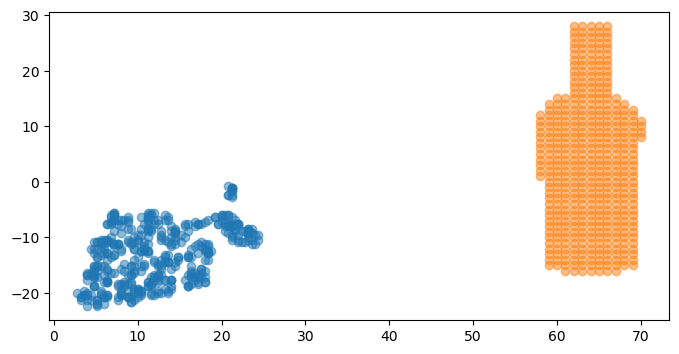

In [3]:

this_file = os.path.realpath('__file__')
data_path = os.path.join(Path(this_file).parent, 'img')
#I1 = pl.imread('../../data/redcross.png').astype(np.float64)[::5, ::5, 2]
#I2 = pl.imread('../../data/tooth.png').astype(np.float64)[::5, ::5, 2]

I1 = pl.imread(os.path.join(data_path, 'grapes2.png'))[::2, ::2, 2]
I2 = pl.imread(os.path.join(data_path, 'bottle.png'))[::2, ::2, 2]

sz = I2.shape[0]
XX, YY = np.meshgrid(np.arange(sz), np.arange(sz))

x1 = np.stack((XX[I1 < 0.7]/2.5, -YY[I1 < 0.7]/2.5), 1) * 1.0
x2 = np.stack((XX[I2 < 0.9] + 30, -YY[I2 < 0.9] + 32), 1) * 1.0
#we want them to have the same number of atoms -> subsample x1
pos = np.random.choice(x1.shape[0], x2.shape[0])
x1 = x1[pos]
print(x1.shape, x2.shape)

pl.figure(1, (8, 4))
pl.scatter(x1[:, 0], x1[:, 1], alpha=0.5)
pl.scatter(x2[:, 0], x2[:, 1], alpha=0.5)

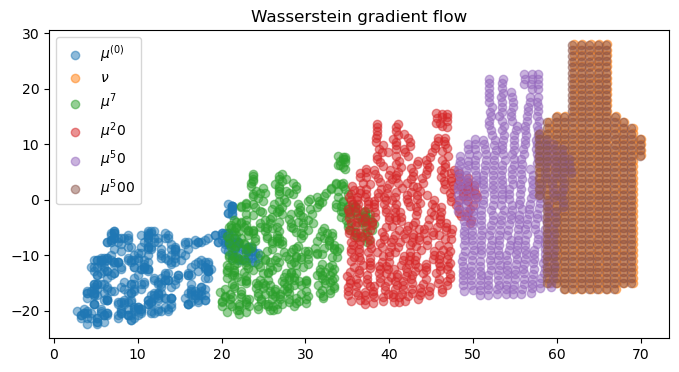

In [4]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# use pyTorch for our data
x1_torch = torch.tensor(x1).to(device=device).requires_grad_(True)
x2_torch = torch.tensor(x2).to(device=device)
a = ot.unif(x1.shape[0])
b = ot.unif(x2.shape[0])
a_torch = torch.tensor(a).to(device=device)
b_torch = torch.tensor(b).to(device=device)


lr = 1e1
nb_iter_max = 501

iter_to_be_saved = [7, 20, 50, 500]
res = list()

x_all = np.zeros((nb_iter_max, x1.shape[0], 2))

loss_iter = []

# generator for random permutations
gen = torch.Generator(device=device)
gen.manual_seed(42)

for i in range(nb_iter_max):

    loss = ot.emd2(a_torch, b_torch, ot.dist(x1_torch, x2_torch))

    loss_iter.append(loss.clone().detach().cpu().numpy())
    loss.backward()

    # performs a step of projected gradient descent
    with torch.no_grad():
        grad = x1_torch.grad
        x1_torch -= grad * lr / (1 + i / 5e1)  # step
        x1_torch.grad.zero_()
        x_all[i, :, :] = x1_torch.clone().detach().cpu().numpy()
    if i in iter_to_be_saved:
        res.append(x_all[i, :, :])

xb = x1_torch.clone().detach().cpu().numpy()

pl.figure(2, (8, 4))
pl.scatter(x1[:, 0], x1[:, 1], alpha=0.5, label=r'$\mu^{(0)}$')
pl.scatter(x2[:, 0], x2[:, 1], alpha=0.5, label=r'$\nu$')
i=0
for m in res:
    pl.scatter(m[:, 0], m[:, 1], alpha=0.5, label=rf'$\mu^{str(iter_to_be_saved[i])}$')
    i+=1
pl.title('Wasserstein gradient flow')
pl.legend()
ax = pl.axis()


# Plot the source/target distributions, and the distributions on the flow

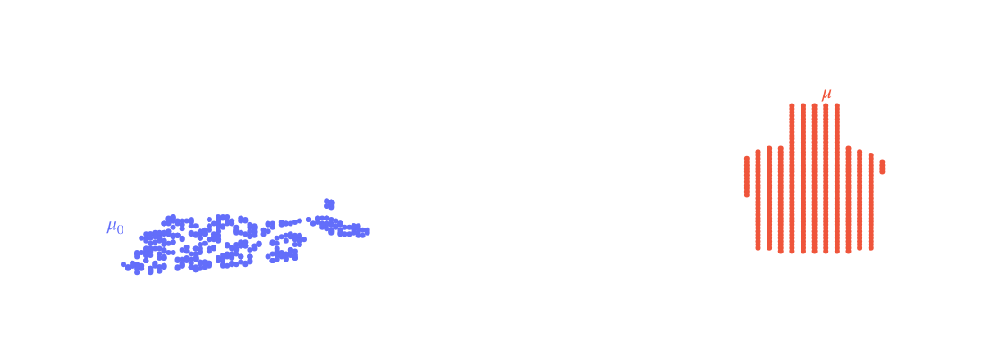

In [5]:

fig = go.Figure()
fig.add_trace(go.Scatter(x=x1[:, 0], y=x1[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=x2[:, 0], y=x2[:, 1], mode="markers", showlegend=False))
#fig.add_trace(go.Scatter(x=xb[:, 0], y=xb[:, 1], mode="markers", showlegend=False))

fig.add_trace(go.Scatter(x=[65], y=[30], text=[r"$\Large {\mu}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#EF553B")))
#fig.add_trace(go.Scatter(x=[5], y=[-10], text=["$\Large {\mu_0}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#00CC96")))
fig.add_trace(go.Scatter(x=[2], y=[-10], text=[r"$\Large {\mu_0}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#636EFA")))


fig.update_xaxes(showticklabels=False, showgrid=False)
fig.update_yaxes(showticklabels=False, showgrid=False)

fig.update_layout(
        height=400, width=600,
    plot_bgcolor='white', paper_bgcolor='white'
    )

fig.show()
fig.write_image('../img/GF_init.pdf')


### First distrib on the flow

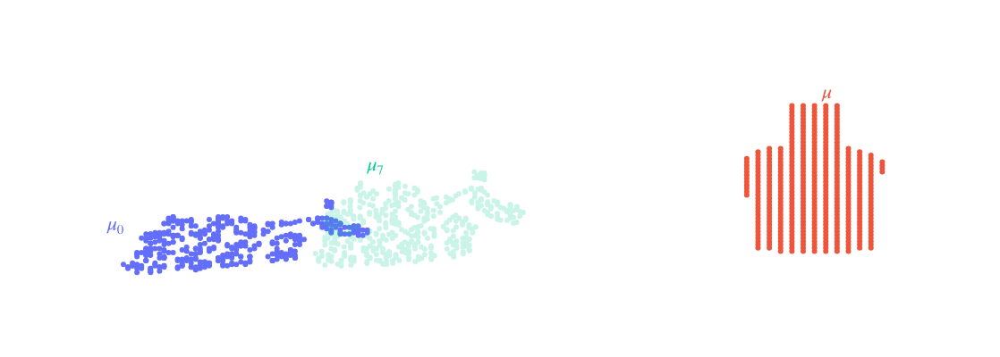

In [6]:
step = 0
opa = 0.2
fig = go.Figure()
fig.add_trace(go.Scatter(x=x1[:, 0], y=x1[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=x2[:, 0], y=x2[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=res[step][:, 0], y=res[step][:, 1], mode="markers", showlegend=False, opacity=opa))

fig.add_trace(go.Scatter(x=[65], y=[30], text=[r"$\Large {\mu}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#EF553B")))
fig.add_trace(go.Scatter(x=[25], y=[8], text=[r"$\Large {\mu_{"+str(iter_to_be_saved[step])+"}}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#00CC96")))
fig.add_trace(go.Scatter(x=[2], y=[-10], text=[r"$\Large {\mu_0}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#636EFA")))


fig.update_xaxes(showticklabels=False, showgrid=False)
fig.update_yaxes(showticklabels=False, showgrid=False)

fig.update_layout(
        height=400, width=600,
    plot_bgcolor='white', paper_bgcolor='white'
    )

fig.show()
#fig.write_image('./img/GF_step1.pdf')


### second distrib

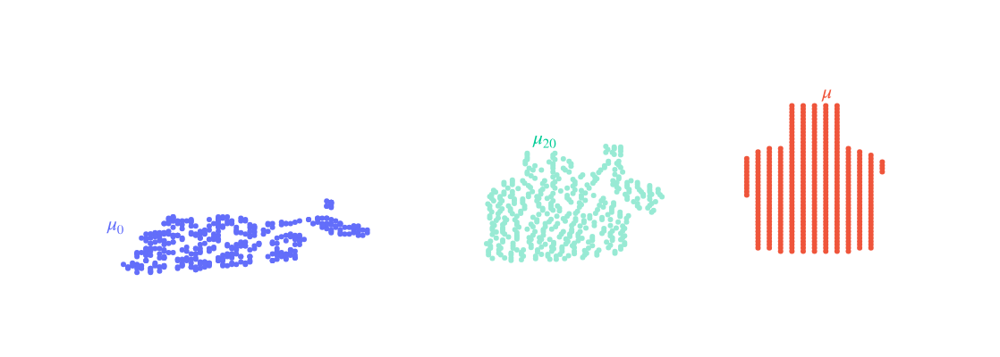

In [7]:
step = 1
opa = 0.4
fig = go.Figure()
fig.add_trace(go.Scatter(x=x1[:, 0], y=x1[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=x2[:, 0], y=x2[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=res[step][:, 0], y=res[step][:, 1], mode="markers", showlegend=False, opacity=opa))

fig.add_trace(go.Scatter(x=[65], y=[30], text=[r"$\Large {\mu}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#EF553B")))
fig.add_trace(go.Scatter(x=[40], y=[16], text=[r"$\Large {\mu_{"+str(iter_to_be_saved[step])+"}}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#00CC96")))
fig.add_trace(go.Scatter(x=[2], y=[-10], text=[r"$\Large {\mu_0}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#636EFA")))


fig.update_xaxes(showticklabels=False, showgrid=False)
fig.update_yaxes(showticklabels=False, showgrid=False)

fig.update_layout(
        height=400, width=600,
    plot_bgcolor='white', paper_bgcolor='white'
    )

fig.show()
#fig.write_image('./img/GF_step2.pdf')


### last step

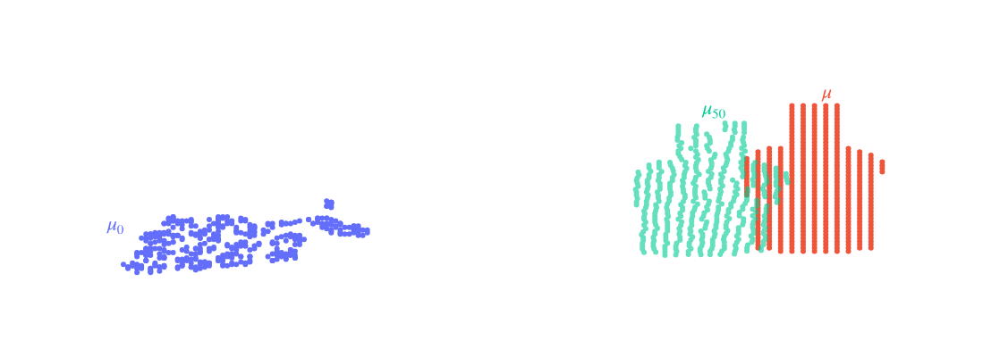

In [8]:
step = 2
opa = 0.6
fig = go.Figure()
fig.add_trace(go.Scatter(x=x1[:, 0], y=x1[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=x2[:, 0], y=x2[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=res[step][:, 0], y=res[step][:, 1], mode="markers", showlegend=False, opacity=opa))

fig.add_trace(go.Scatter(x=[65], y=[30], text=[r"$\Large {\mu}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#EF553B")))
fig.add_trace(go.Scatter(x=[55], y=[25], text=[r"$\Large {\mu_{"+str(iter_to_be_saved[step])+"}}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#00CC96")))
fig.add_trace(go.Scatter(x=[2], y=[-10], text=[r"$\Large {\mu_0}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#636EFA")))


fig.update_xaxes(showticklabels=False, showgrid=False)
fig.update_yaxes(showticklabels=False, showgrid=False)

fig.update_layout(
        height=400, width=600,
    plot_bgcolor='white', paper_bgcolor='white'
    )

fig.show()
#fig.write_image('./img/GF_step3.pdf')


### and the final...

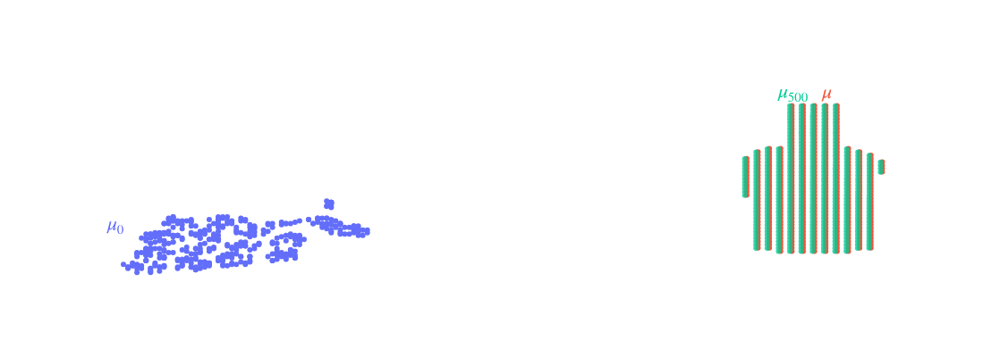

In [9]:
step = 3
opa = 0.8
fig = go.Figure()
fig.add_trace(go.Scatter(x=x1[:, 0], y=x1[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=x2[:, 0], y=x2[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=res[step][:, 0], y=res[step][:, 1], mode="markers", showlegend=False, opacity=opa))

fig.add_trace(go.Scatter(x=[65], y=[30], text=[r"$\Large {\mu}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#EF553B")))
fig.add_trace(go.Scatter(x=[62], y=[30], text=[r"$\Large {\mu_{"+str(iter_to_be_saved[step])+"}}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#00CC96")))
fig.add_trace(go.Scatter(x=[2], y=[-10], text=[r"$\Large {\mu_0}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#636EFA")))


fig.update_xaxes(showticklabels=False, showgrid=False)
fig.update_yaxes(showticklabels=False, showgrid=False)

fig.update_layout(
        height=400, width=600,
    plot_bgcolor='white', paper_bgcolor='white'
    )

fig.show()
#fig.write_image('./img/GF_final.pdf')


## Make an animation

In [10]:
print(x_all.shape)
a = x_all[i, :, 0]
print(a.shape)
print(x2[:, 0].shape)
fig = go.Figure()
step = 3
opa = 0.5
fig = go.Figure()
fig.add_trace(go.Scatter(x=x1[:, 0], y=x1[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=x2[:, 0], y=x2[:, 1], mode="markers", showlegend=False))
fig.add_trace(go.Scatter(x=x_all[0, :, 0], y=x_all[0, :, 1], mode="markers", showlegend=False, opacity=opa))

fig.add_trace(go.Scatter(x=[65], y=[30], text=[r"$\Large {\mu}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#EF553B")))
fig.add_trace(go.Scatter(x=[2], y=[-10], text=[r"$\Large {\mu_0}$"], mode="text",  textposition="top center",showlegend=False, textfont=dict(color="#636EFA")))

i=10


frames =[go.Frame(data=[go.Scatter(visible=True),
                        go.Scatter(visible=True),
                        go.Scatter(x=x_all[i, :, 0], y=x_all[i, :, 1], opacity = 0.5+(i*0.5)/nb_iter_max),
                        go.Scatter(visible=True),
                        go.Scatter(visible=True)],
                  traces=[0,1,2, 3, 4]) for i in np.arange(0, nb_iter_max)]   # define 20 frames


fig.update_xaxes(showticklabels=False, showgrid=False)
fig.update_yaxes(showticklabels=False, showgrid=False)


fig.frames=frames
button = dict(
             label='Play',
             method='animate',
             args=[None, dict(frame=dict(duration=100, redraw=False), 
                              transition=dict(duration=1),
                              fromcurrent=True,
                              mode='immediate')])
fig.update_layout(updatemenus=[dict(type='buttons',
                              showactive=False,
                              y=0,
                              x=1.05,
                              xanchor='left',
                              yanchor='bottom',
                              buttons=[button] )
                                      ],
                 width=1000, height=700)

fig.show(renderer="colab")


(501, 425, 2)
(425,)
(425,)
